Calculate the Bayes Factor for $u-r$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

# import pocomc as pc
import corner

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
data_directory = '../../../../data/'
# data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'NSA_v1_0_1_VAGC_vflag-V2-VF_updated.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
ur_NSA = np.array(catalog_main['u_r'])

## Separate galaxies by their LSS classifications

### $V^2$

In [6]:
wall_v2 = catalog_main['vflag_V2'] == 0
void_v2 = catalog_main['vflag_V2'] == 1
edge_v2 = catalog_main['vflag_V2'] == 2
out_v2 = catalog_main['vflag_V2'] == 9

### VoidFinder

In [7]:
wall_vf = catalog_main['vflag_VF'] == 0
void_vf = catalog_main['vflag_VF'] == 1
edge_vf = catalog_main['vflag_VF'] == 2
out_vf = catalog_main['vflag_VF'] == 9

In [8]:
del catalog_main, catalog_north, data

# Fit the color distributions with skewnormal distributions

Both one- and two-parent models

This is a bimodal distribution

In [9]:
#ur_bins = np.linspace(0, 4, 170)
ur_bins = np.arange(0.5, 4, 0.05)

In [10]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

labels1_tri = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                    'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$', 
                    'c', r'$\mu_c$', r'$\sigma_c$', 'skew$_c$']
labels2_tri = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
               '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
               '$c_2$', r'$\mu_{1c}$', r'$\sigma_{1c}$', 'skew$_{1c}$', 
               '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
               '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$', 
               '$c_2$', r'$\mu_{2c}$', r'$\sigma_{2c}$', 'skew$_{2c}$']

## V$^2$

### 1-parent model

#### Void v. wall

In [11]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-20241108.pickle', 'rb')
V2_results1_samples, lnzM1_V2 = pickle.load(temp_infile)
temp_infile.close()

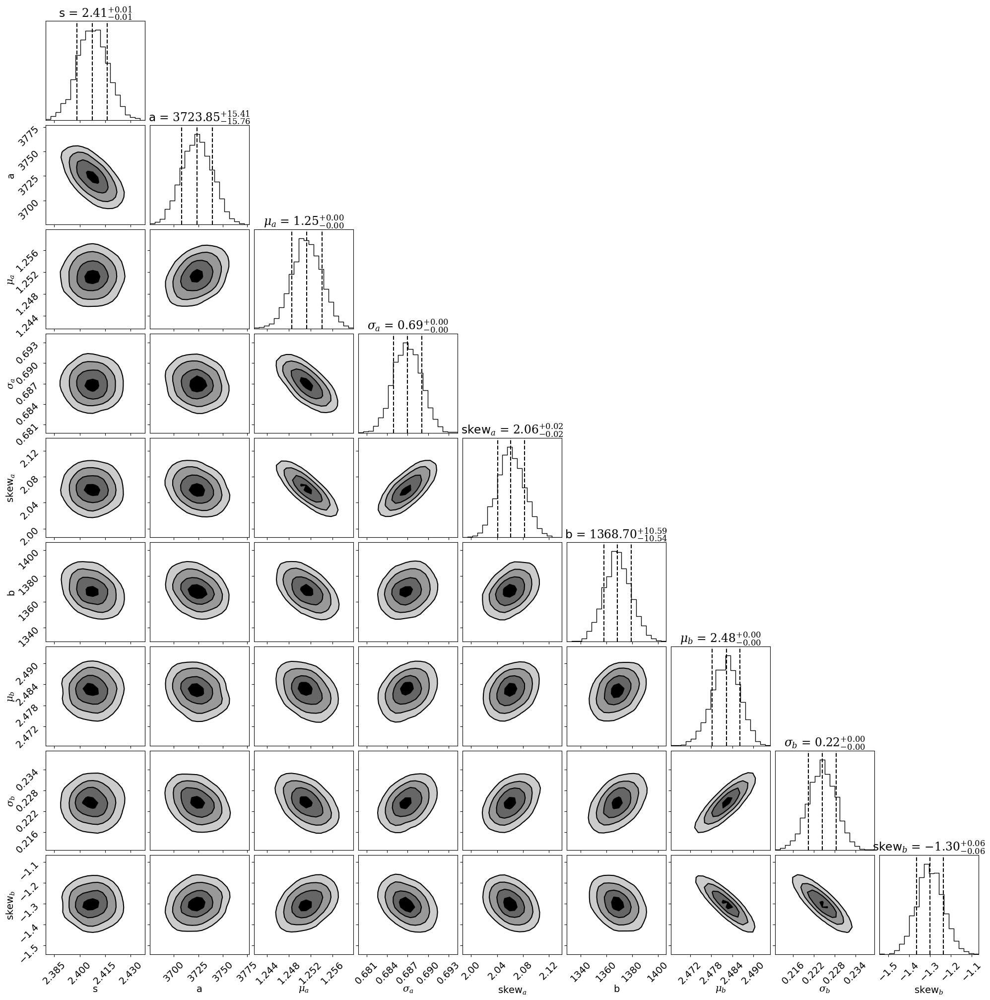

In [12]:
# pc.plotting.corner(V2_results1, 
corner.corner(V2_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [13]:
# lnzM1_V2 = V2_results1['logz'][-1]
lnzM1_V2

np.float64(-1372.6737022032833)

In [14]:
# V2_bestfit1 = np.median(V2_results1['samples'], axis=0)
V2_bestfit1 = np.median(V2_results1_samples, axis=0)

V2_bestfit1

array([ 2.40754072e+00,  3.72384945e+03,  1.25127475e+00,  6.86950704e-01,
        2.06094559e+00,  1.36869939e+03,  2.48230623e+00,  2.24439309e-01,
       -1.30069431e+00])

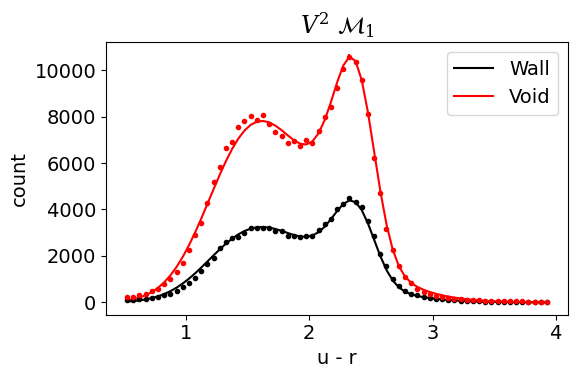

In [15]:
Model_1_plot(V2_bestfit1, 
             ur_NSA[wall_v2], 
             ur_NSA[void_v2], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

#### Wall v. all

In [21]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2wall-20241108.pickle', 'rb')
V2wall_results1_samples, lnzM1_V2wall = pickle.load(temp_infile)
temp_infile.close()

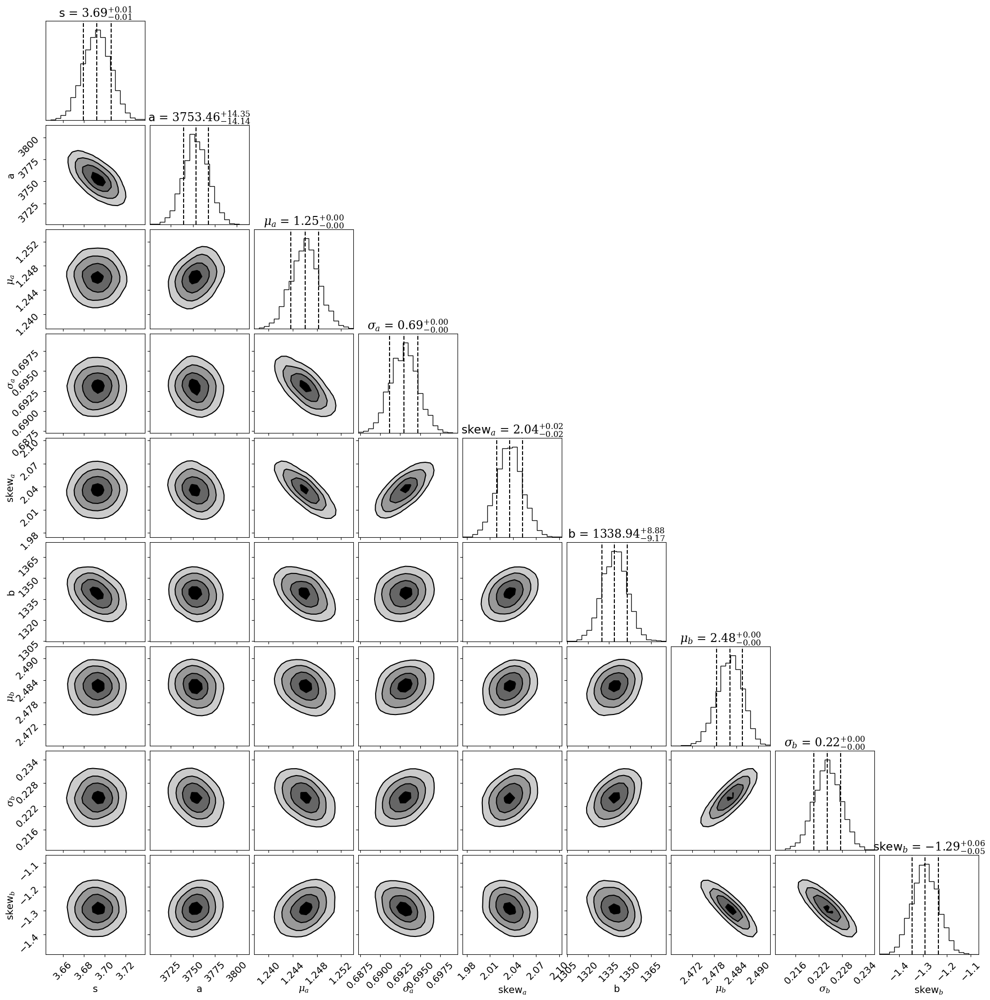

In [22]:
corner.corner(V2wall_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [23]:
lnzM1_V2wall

np.float64(-1653.3842370930279)

In [24]:
V2wall_bestfit1 = np.median(V2wall_results1_samples, axis=0)

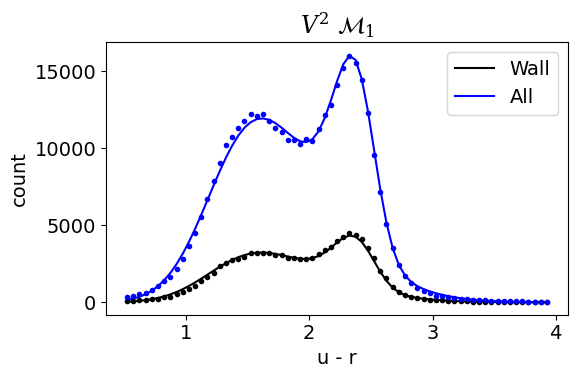

In [25]:
Model_1_plot(V2wall_bestfit1, 
             ur_NSA[wall_v2], 
             ur_NSA[void_v2 | wall_v2 | edge_v2], 
             ur_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='u - r', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

#### Void v. all

In [41]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2void-20241108.pickle', 'rb')
V2void_results1_samples, lnzM1_V2void = pickle.load(temp_infile)
temp_infile.close()

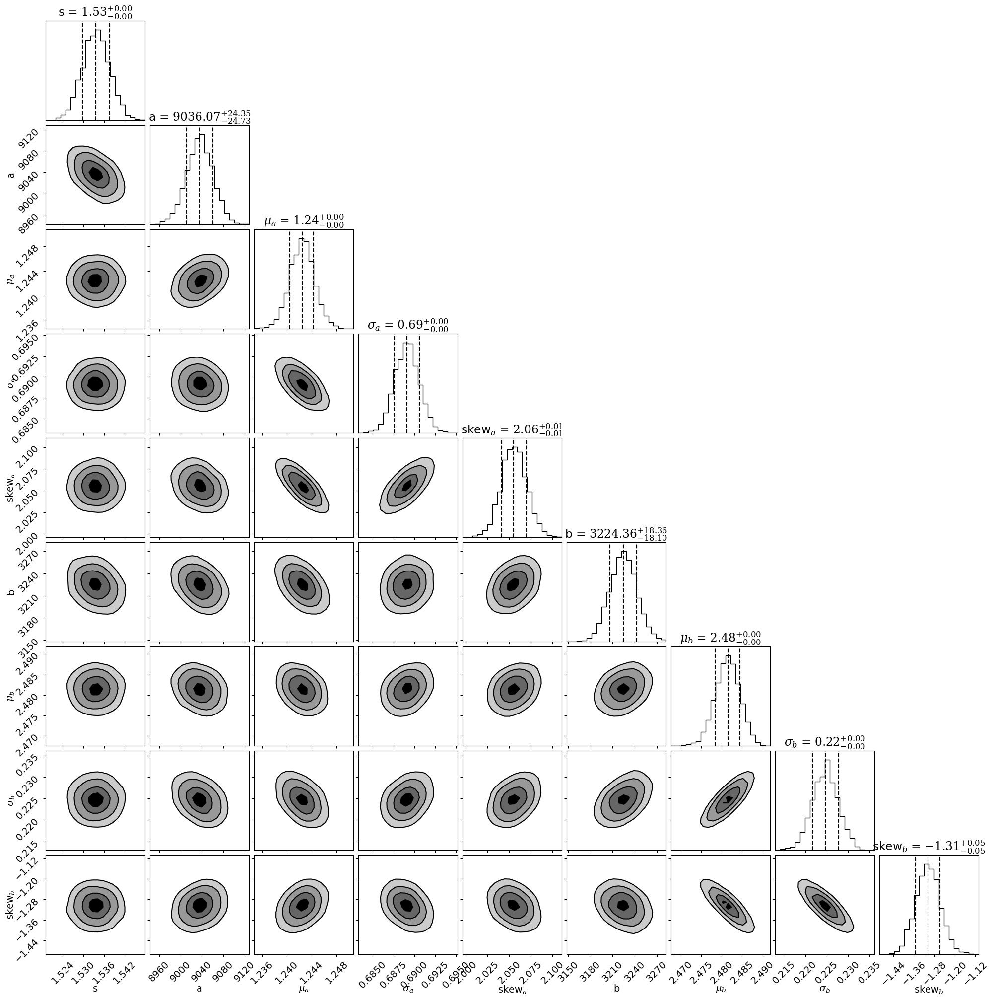

In [42]:
corner.corner(V2void_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [43]:
lnzM1_V2void

np.float64(-1837.1137412435992)

In [44]:
V2void_bestfit1 = np.median(V2void_results1_samples, axis=0)

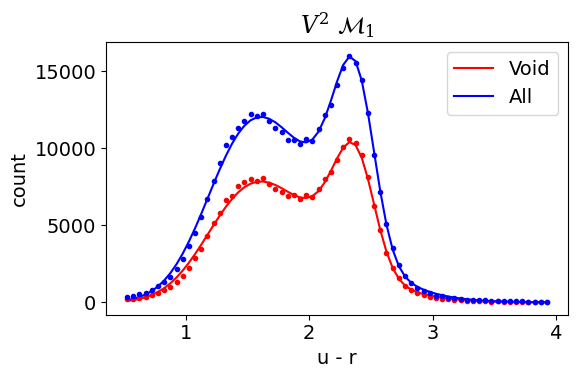

In [45]:
Model_1_plot(V2void_bestfit1, 
             ur_NSA[void_v2], 
             ur_NSA[void_v2 | wall_v2 | edge_v2], 
             ur_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='u - r', 
             title_text=r'$V^2$ $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [16]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2-20241108.pickle', 'rb')
# V2_results2 = pickle.load(temp_infile)
V2_results2_samples, lnzM2_V2 = pickle.load(temp_infile)
temp_infile.close()

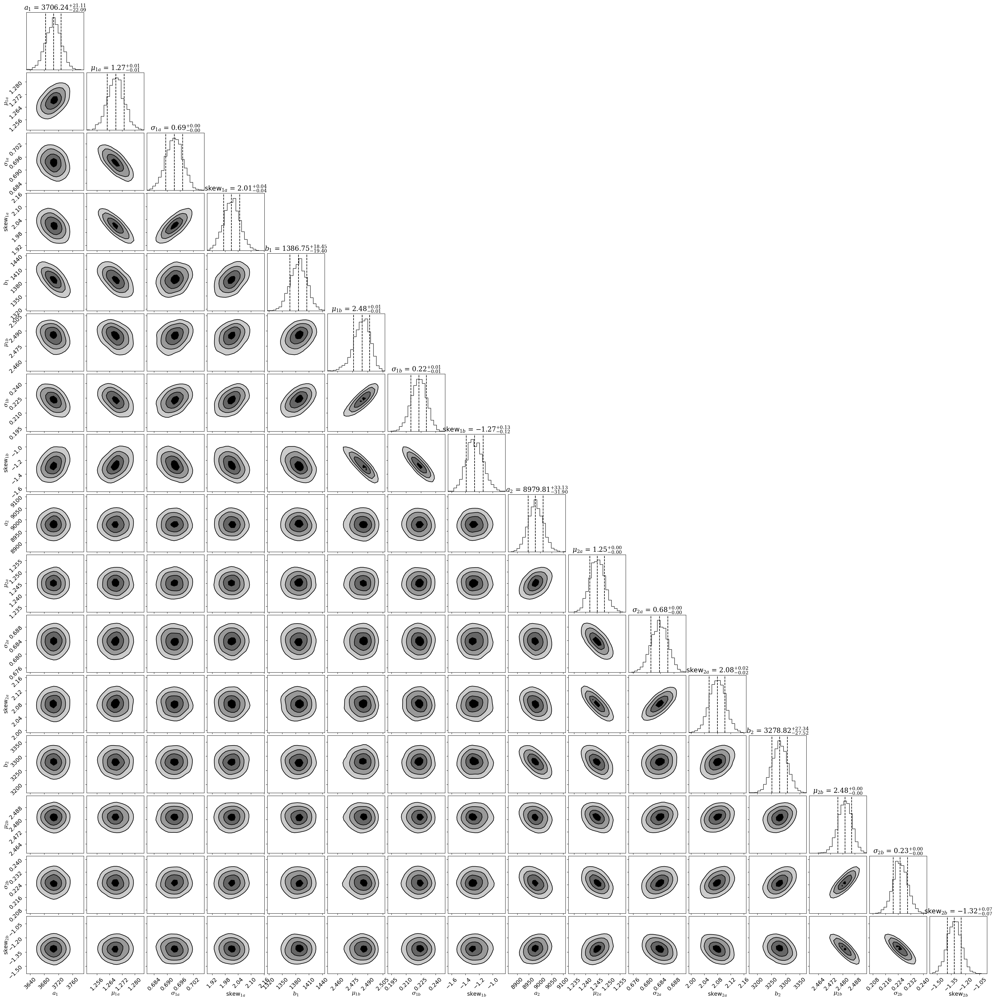

In [17]:
# pc.plotting.corner(V2_results2, 
corner.corner(V2_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [18]:
# lnzM2_V2 = V2_results2['logz'][-1]
lnzM2_V2

np.float64(-1311.5125837897467)

In [19]:
# V2_bestfit2 = np.median(V2_results2['samples'], axis=0)
V2_bestfit2 = np.median(V2_results2_samples, axis=0)
V2_bestfit2

array([ 3.70623846e+03,  1.26790814e+00,  6.93290726e-01,  2.00976692e+00,
        1.38674610e+03,  2.48460418e+00,  2.23089313e-01, -1.26695616e+00,
        8.97980868e+03,  1.24510768e+00,  6.83717431e-01,  2.07946232e+00,
        3.27881894e+03,  2.48147860e+00,  2.25226439e-01, -1.31889832e+00])

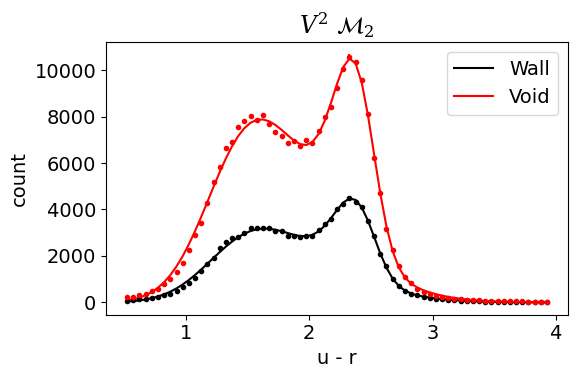

In [20]:
Model_2_plot(V2_bestfit2, 
             ur_NSA[wall_v2], 
             ur_NSA[void_v2], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$ $\mathcal{M}_2$');

#### Wall v. all

In [27]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2wall-20241108.pickle', 'rb')
V2wall_results2_samples, lnzM2_V2wall = pickle.load(temp_infile)
temp_infile.close()

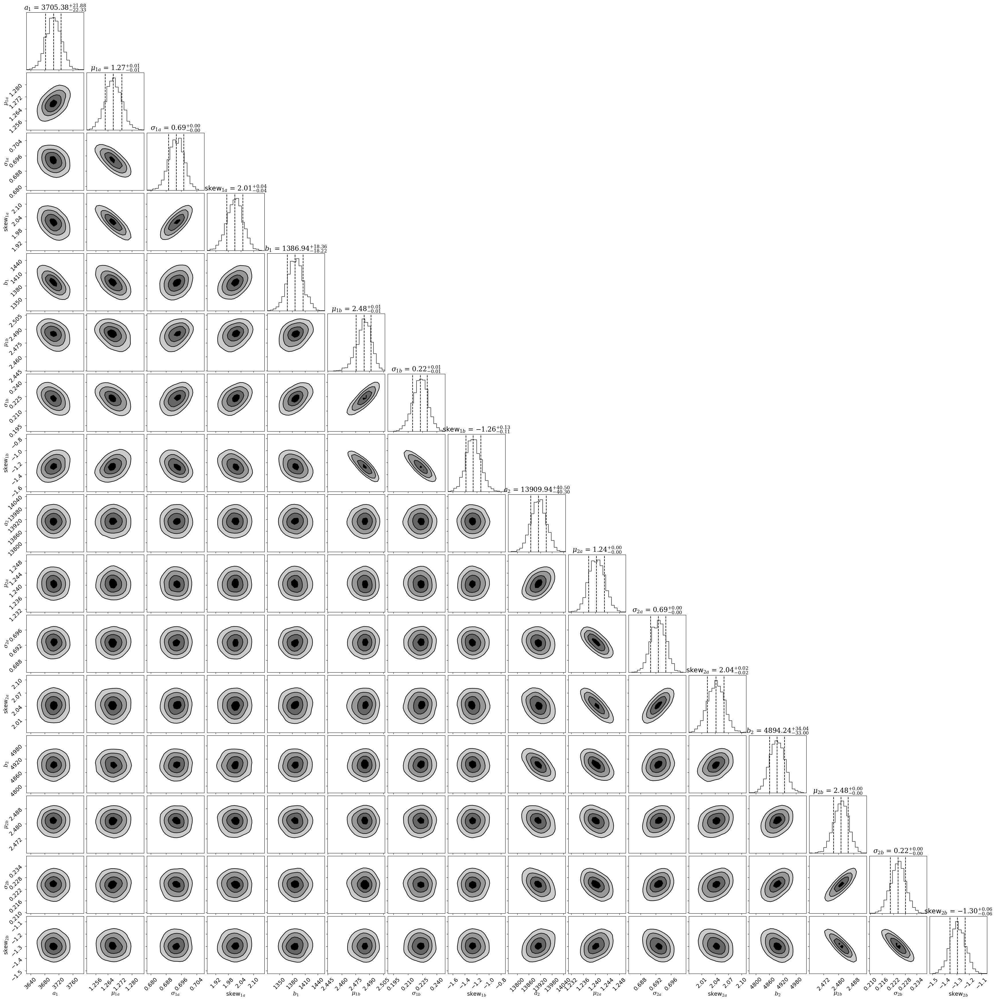

In [28]:
corner.corner(V2wall_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [29]:
lnzM2_V2wall

np.float64(-1559.7062147814565)

In [30]:
V2wall_bestfit2 = np.median(V2wall_results2_samples, axis=0)

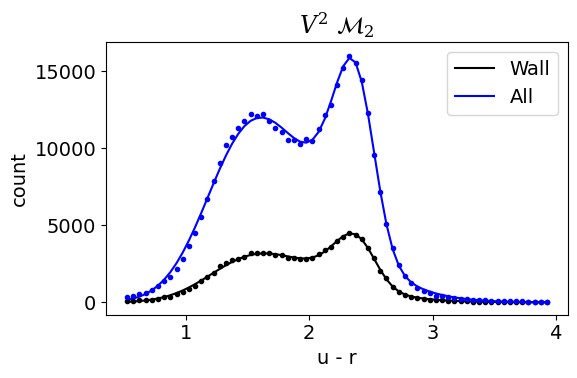

In [31]:
Model_2_plot(V2wall_bestfit2, 
             ur_NSA[wall_v2], 
             ur_NSA[void_v2 | wall_v2 | edge_v2], 
             ur_bins, 
             2, 
             label1_text='Wall', 
             label2_text='All',
             xlabel_text='u - r', 
             title_text=r'$V^2$ $\mathcal{M}_2$');

#### Void v. all

In [34]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2void-20241108.pickle', 'rb')
V2void_results2_samples, lnzM2_V2void = pickle.load(temp_infile)
temp_infile.close()

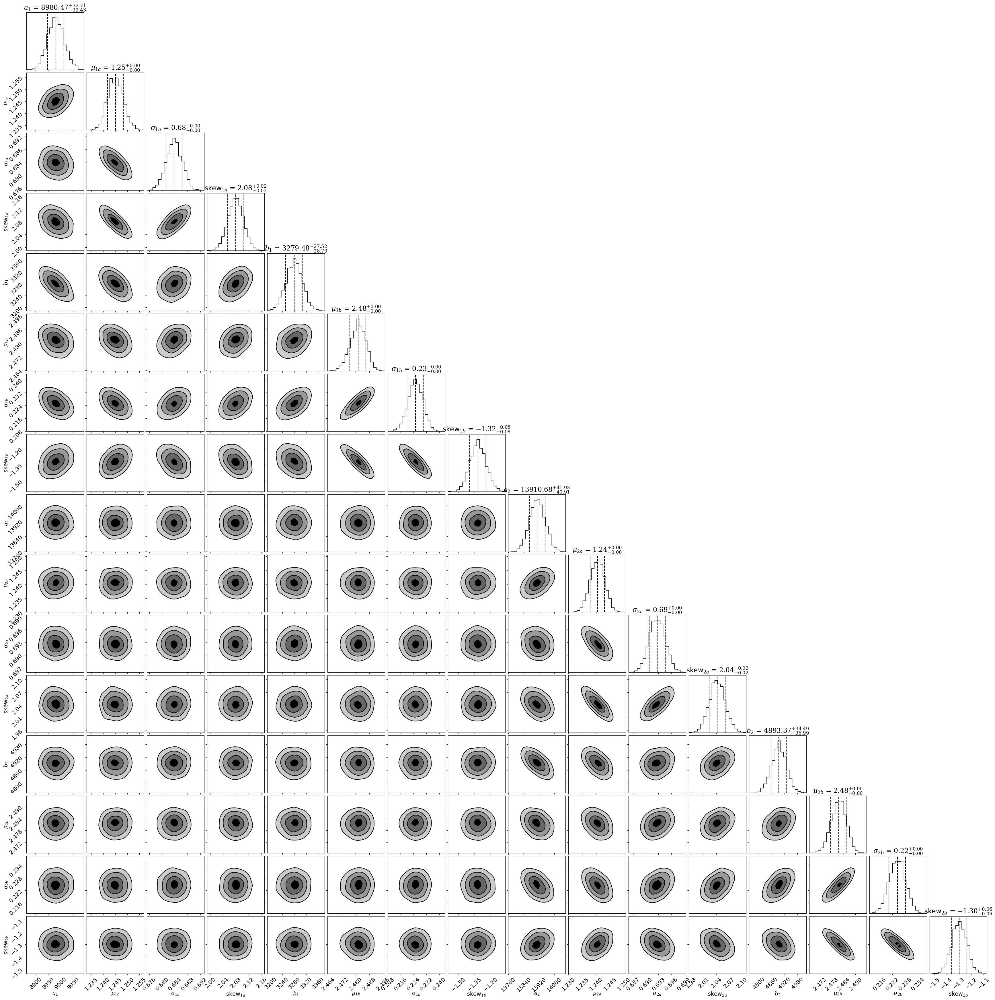

In [35]:
corner.corner(V2void_results2_samples,
              labels=labels2_bi, 
              dims=range(len(labels2_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [36]:
lnzM2_V2void

np.float64(-1833.5921166909475)

In [37]:
V2void_bestfit2 = np.median(V2void_results2_samples, axis=0)

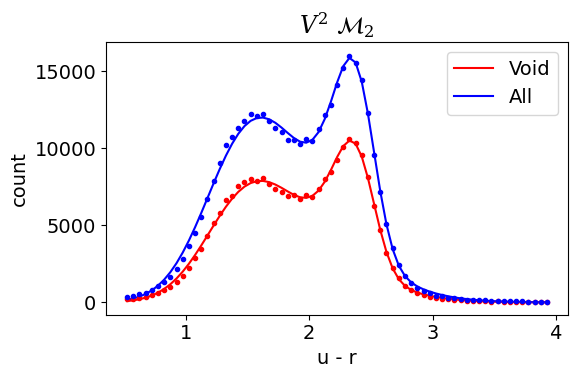

In [38]:
Model_2_plot(V2void_bestfit2, 
             ur_NSA[void_v2], 
             ur_NSA[void_v2 | wall_v2 | edge_v2], 
             ur_bins, 
             2, 
             label1_text='Void', 
             label2_text='All',
             xlabel_text='u - r', 
             title_text=r'$V^2$ $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [39]:
lnB12_V2 = lnzM1_V2 - lnzM2_V2

B12_V2 = np.exp(lnB12_V2)

print('V2 u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2, lnB12_V2*np.log10(np.exp(1))))

V2 u-r: B12 = 2.74e-27; log(B12) = -26.562


#### Wall v. all

In [40]:
lnB12_V2wall = lnzM1_V2wall - lnzM2_V2wall

B12_V2wall = np.exp(lnB12_V2wall)

print('V2 (wall v. all) u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2wall, lnB12_V2wall*np.log10(np.exp(1))))

V2 (wall v. all) u-r: B12 = 2.07e-41; log(B12) = -40.684


#### Void v. all

In [46]:
lnB12_V2void = lnzM1_V2void - lnzM2_V2void

B12_V2void = np.exp(lnB12_V2void)

print('V2 (void v. all) u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2void, lnB12_V2void*np.log10(np.exp(1))))

V2 (void v. all) u-r: B12 = 0.0296; log(B12) = -1.529


## VoidFinder

### 1-parent model

In [26]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_VoidFinder.pickle', 'rb')
VF_results1 = pickle.load(temp_infile)
temp_infile.close()

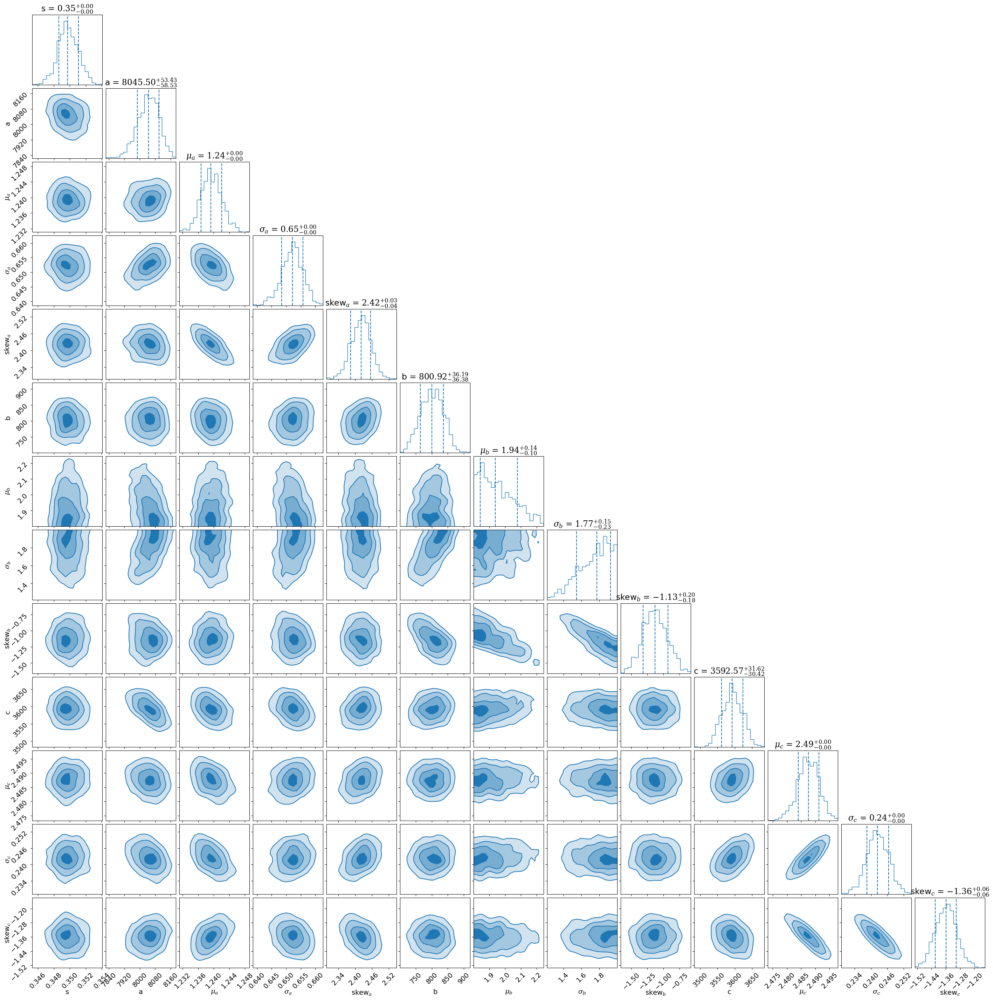

In [28]:
pc.plotting.corner(VF_results1, 
                   labels=labels1_tri, 
                   dims=range(len(labels1_tri)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [29]:
lnzM1_VF = VF_results1['logz'][-1]
lnzM1_VF

-4432.933548298204

In [30]:
VF_bestfit1 = np.median(VF_results1['samples'], axis=0)

VF_bestfit1

array([ 3.4974274e-01,  8.0455034e+03,  1.2392821e+00,  6.5220249e-01,
        2.4210610e+00,  8.0091876e+02,  1.9388509e+00,  1.7743773e+00,
       -1.1320140e+00,  3.5925737e+03,  2.4875813e+00,  2.4237528e-01,
       -1.3572396e+00], dtype=float32)

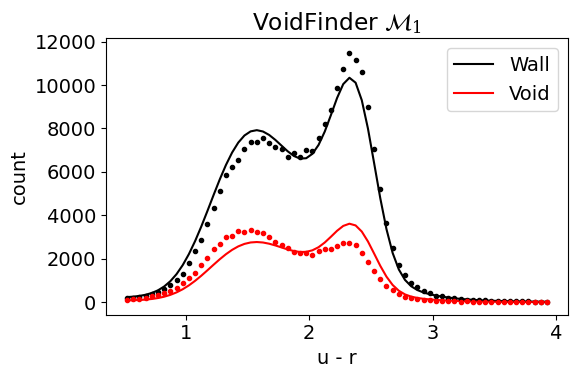

In [31]:
Model_1_plot(VF_bestfit1, 
             ur_NSA[wall_vf], 
             ur_NSA[void_vf], 
             ur_bins, 
             3, 
             xlabel_text='u - r', 
             title_text=r'VoidFinder $\mathcal{M}_1$');

### 2-parent model

In [32]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_VoidFinder.pickle', 'rb')
VF_results2 = pickle.load(temp_infile)
temp_infile.close()

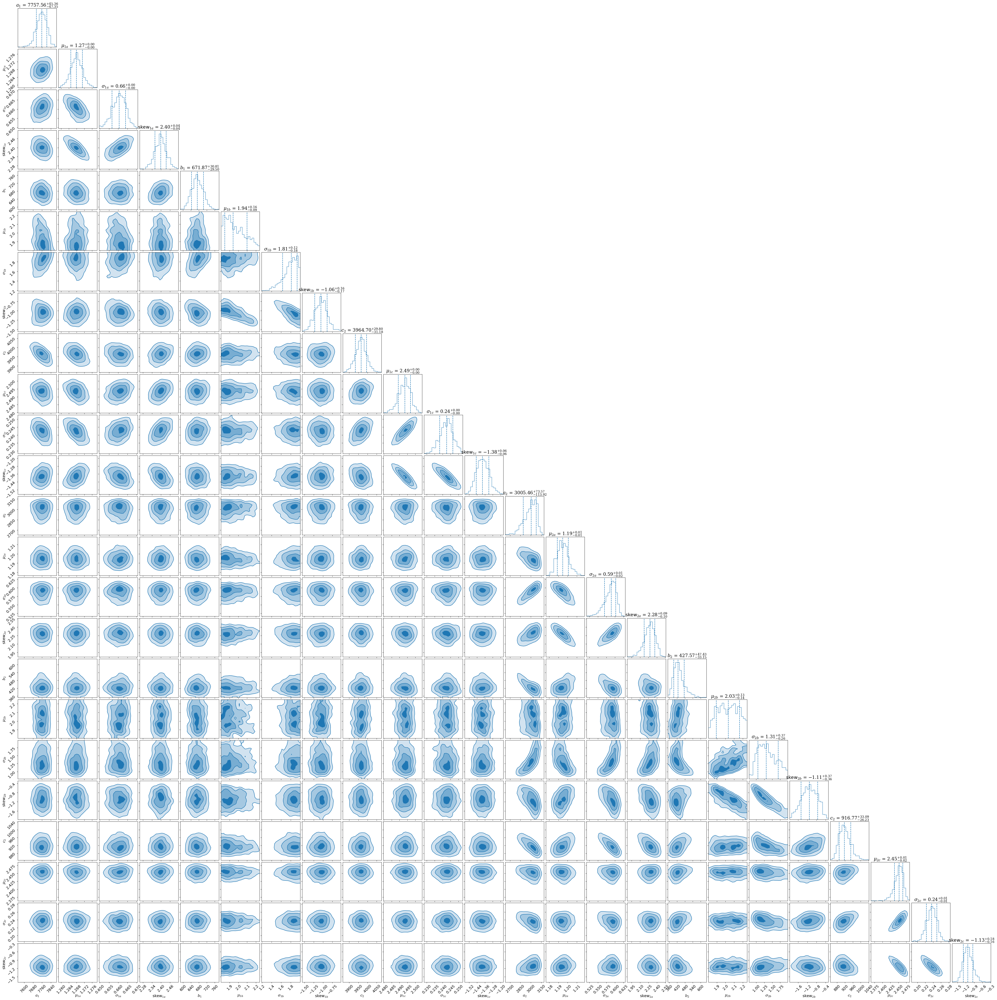

In [34]:
pc.plotting.corner(VF_results2, 
                   labels=labels2_tri, 
                   dims=range(len(labels2_tri)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [35]:
lnzM2_VF = VF_results2['logz'][-1]
lnzM2_VF

-765.3559407583272

In [36]:
VF_bestfit2 = np.median(VF_results2['samples'], axis=0)

VF_bestfit2

array([ 7.7575630e+03,  1.2678946e+00,  6.6055357e-01,  2.3980060e+00,
        6.7187122e+02,  1.9403224e+00,  1.8123093e+00, -1.0575175e+00,
        3.9647021e+03,  2.4933643e+00,  2.4250820e-01, -1.3840339e+00,
        3.0054634e+03,  1.1947045e+00,  5.8937275e-01,  2.2754540e+00,
        4.2757465e+02,  2.0333781e+00,  1.3126452e+00, -1.1141007e+00,
        9.1677325e+02,  2.4526005e+00,  2.3633534e-01, -1.1318599e+00],
      dtype=float32)

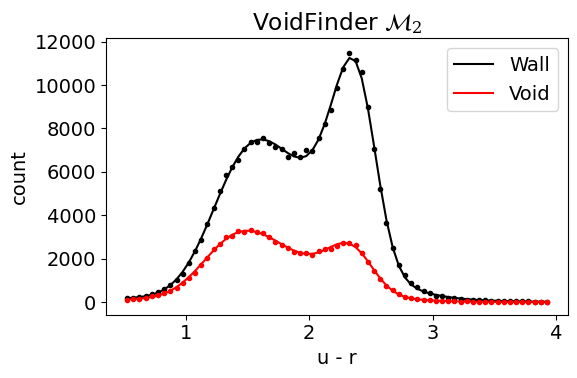

In [37]:
Model_2_plot(VF_bestfit2, 
             ur_NSA[wall_vf], 
             ur_NSA[void_vf], 
             ur_bins, 
             3, 
             xlabel_text='u - r', 
             title_text=r'VoidFinder $\mathcal{M}_2$');

### Bayes Factor

In [38]:
lnB12_VF = lnzM1_VF - lnzM2_VF

B12_VF = np.exp(lnB12_VF)

print('VoidFinder u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_VF, lnB12_VF*np.log10(np.exp(1))))

VoidFinder u-r: B12 = 0; log(B12) = -1592.809


So both VoidFinder and V$^2$ favor $\mathcal{M}_2$, in which the two data sets come from different parent distributions, although VoidFinder favors it much more than V$^2$.